In [17]:
from matplotlib.image import imread, imsave
import numpy as np
import matplotlib.pyplot as plt
import cv2
# %run -i "C:\\Users\\talro\\iCloudDrive\\תואר ראשון מתמטיקה\\שנה ג'\\סמסטר ב'\\עיבוד תמונה\\FINALPROJECT\\Image-Processing-FP\\DIP Project -Stress Fibers1.ipynb"
# %run -i "C:\\Users\\talro\\iCloudDrive\\תואר ראשון מתמטיקה\\שנה ג'\\סמסטר ב'\\עיבוד תמונה\\FINALPROJECT\\Image-Processing-FP\\Superpixel.ipynb"

In [18]:
image_array = cv2.imreadmulti("pic1.tif")

In [19]:
img_stack = image_array[1]

[0 1 2 3 4 5] 2


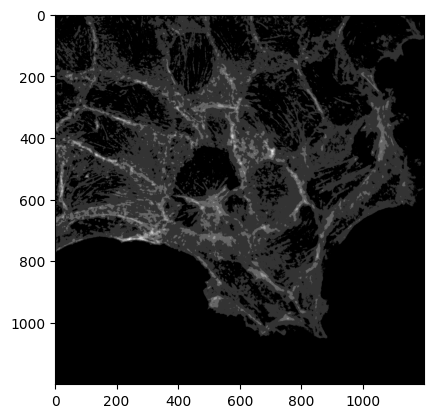

In [20]:
temp = img_stack[0].copy()
# temp[temp <= np.max(img_stack[0])//2] = 0
print(np.unique(temp), np.max(img_stack[0])//2)
plt.imshow(temp, cmap='gray')

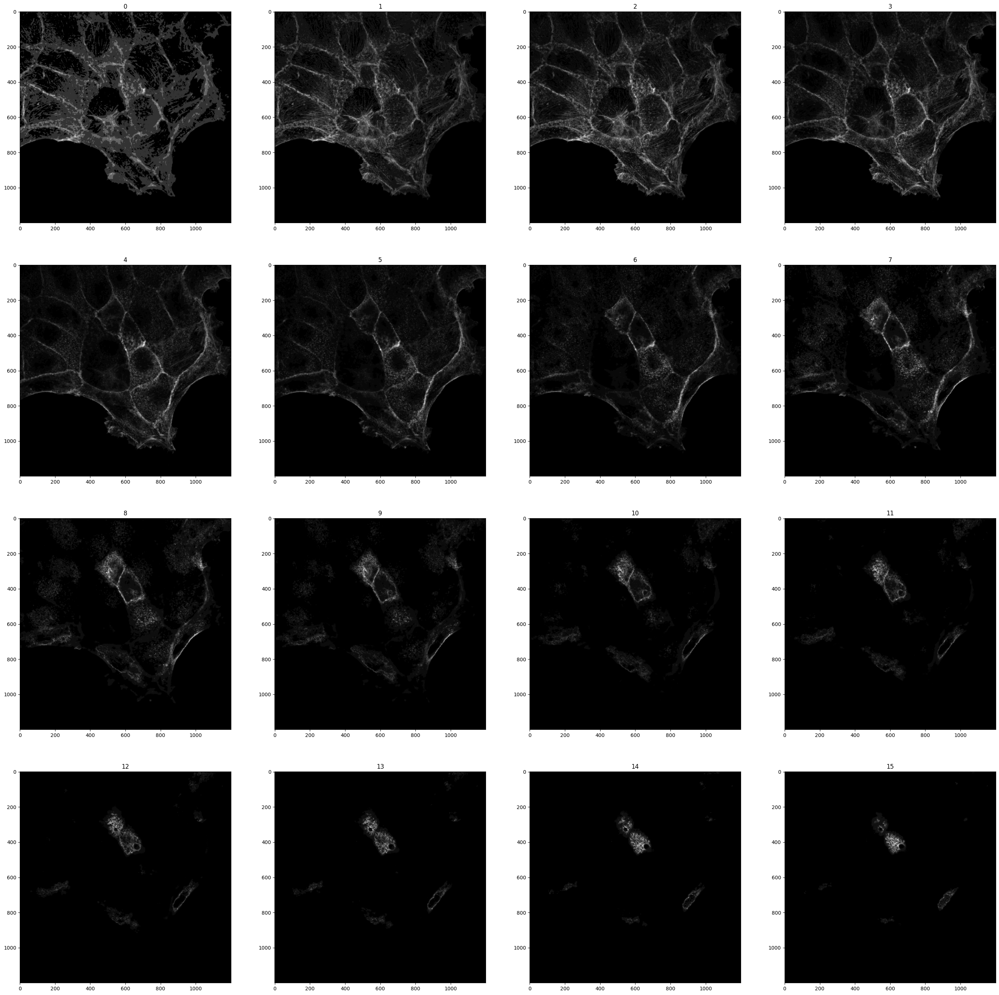

In [21]:
stack_len = len(img_stack)
rows = stack_len//4
cols = stack_len//rows
fig, a = plt.subplots(rows, cols, figsize=(35,35))
k = 0
for i in range(rows):
    for j in range(cols):
        a[i, j].imshow(img_stack[k], cmap='gray')
        a[i,j].set_title(k)
        k += 1

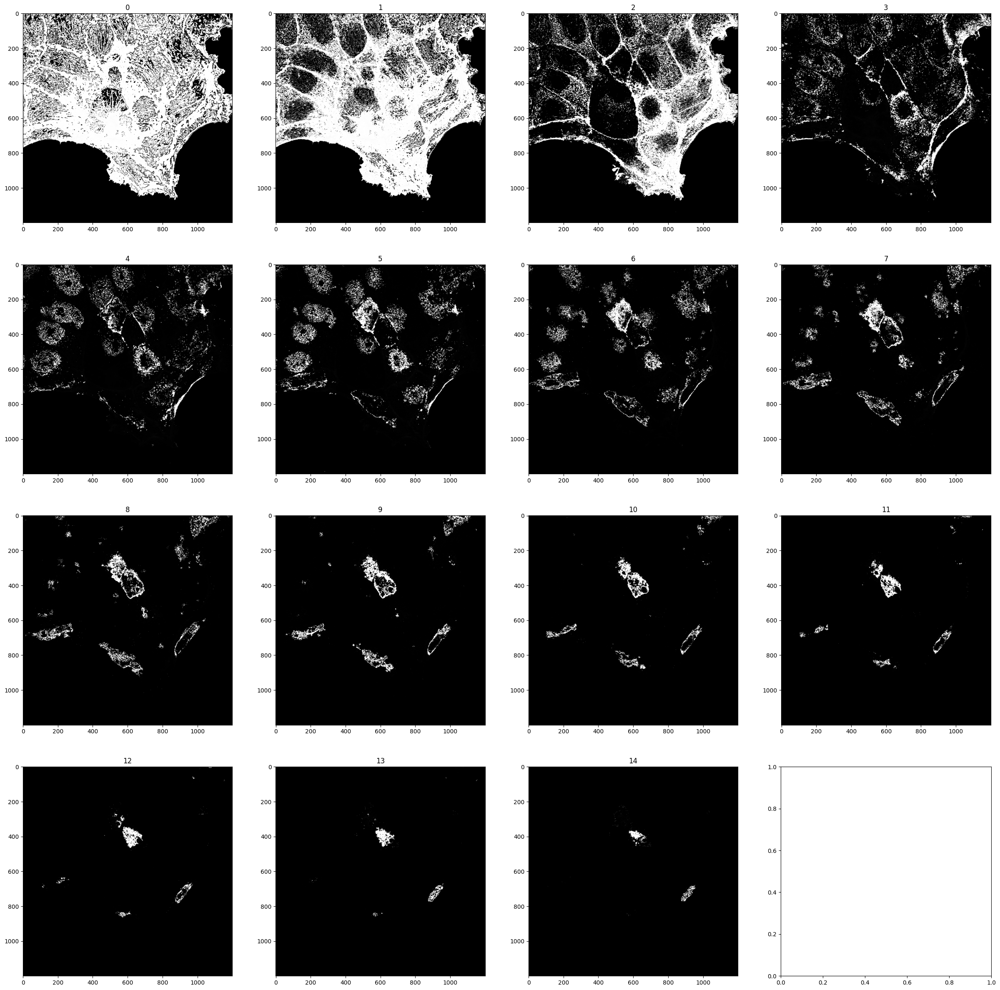

In [22]:
stack_len = len(img_stack)
rows = stack_len//4
cols = stack_len//rows
fig, a = plt.subplots(rows, cols, figsize=(30,30))
k = 0
diff_list = []
for i in range(rows):
    for j in range(cols):
        # diff_list.append(img_stack[k].astype(np.int8)- img_stack[k+1])
        diff_list.append(img_stack[k]- img_stack[k+1])
        l = diff_list[k] 
        # if l.min() < 0: l += abs(np.min(diff_list[k]))
        # l = l.astype(np.uint8)
        # l = cv2.GaussianBlur(l,(21,21), 5)
        # l[l < 128] = 0
        # l[l>= 128] = 1
        a[i, j].imshow(l, cmap='gray')
        a[i,j].set_title(k)
        k += 1
        if k == 15:
            break

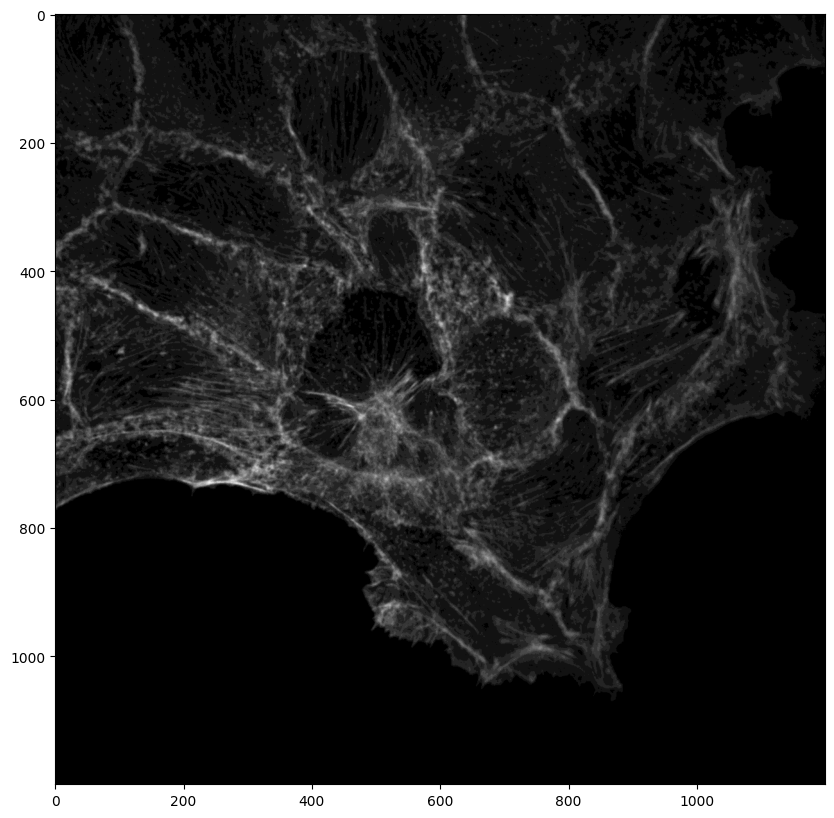

In [23]:
plt.figure(figsize=(10,10))
plt.imshow(img_stack[1].copy(), cmap='gray')

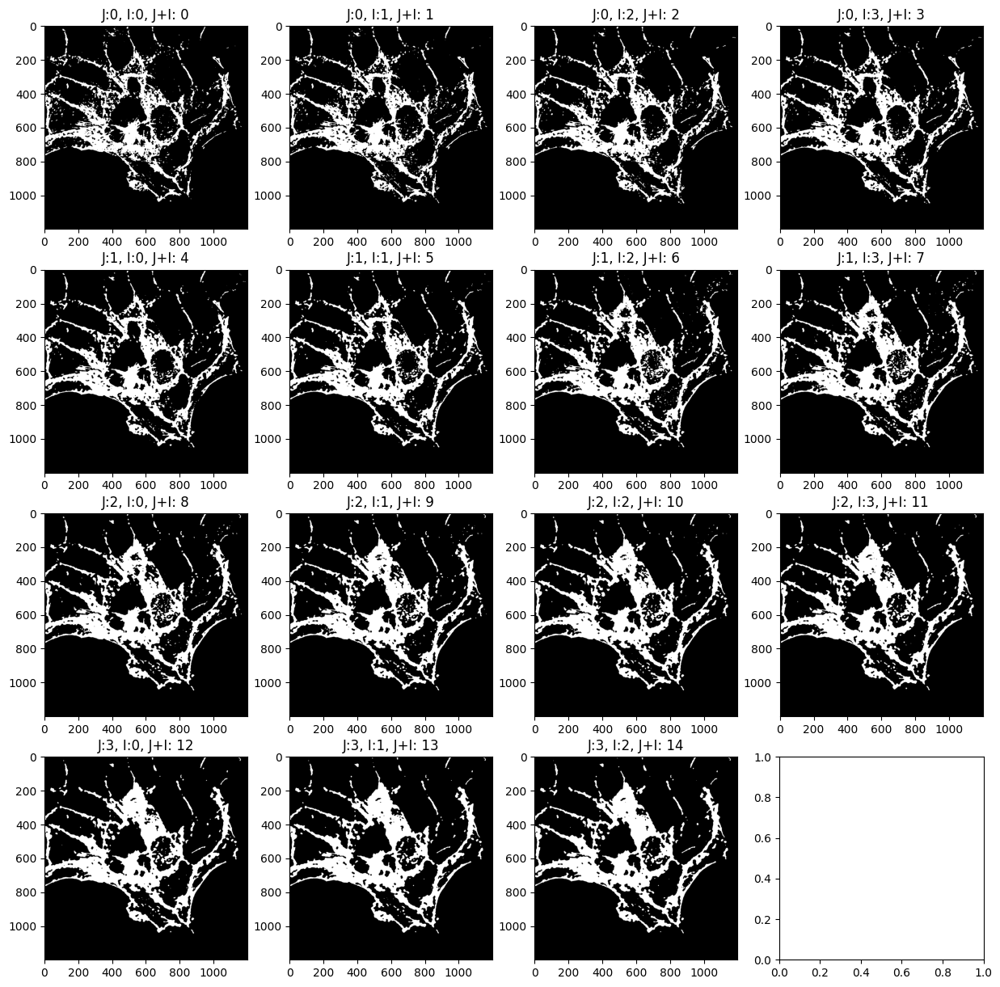

In [24]:
temp = np.zeros_like(img_stack[0])
f, a = plt.subplots(4,4, figsize=(15,15))
kernel_size = (91, 91)  # Adjust the kernel size according to your needs
j = -1
global image
for i, timg in enumerate(img_stack[1:]):
    if not i%4 and j<3:
        j+=1
    kernel_size = (9, 9)  # Adjust the kernel size according to your needs
    # kernel_size = (5, 5)  # Adjust the kernel size according to your needs
    # filtered_img = cv2.blur(img, kernel_size)
    # d = 5
    d = timg.max()//4
    # temp[img < d] = 0
    # temp = cv2.blur(temp, kernel_size)
    # temp_img = cv2.bilateralFilter(img, 9,23,23)
    # temp = cv2.GaussianBlur(temp, kernel_size, 5)
    temp[timg >= d] =1
    temp = cv2.medianBlur(temp, 5)
    if j == 0 and i == 3:
        image = temp
    a[j, i%4].imshow(temp,cmap='gray')
    a[j, i%4].set_title(f"J:{j}, I:{i%4}, J+I: {i}")
# temp = cv2.morphologyEx(temp, cv2.MORPH_OPEN, kernel_size)


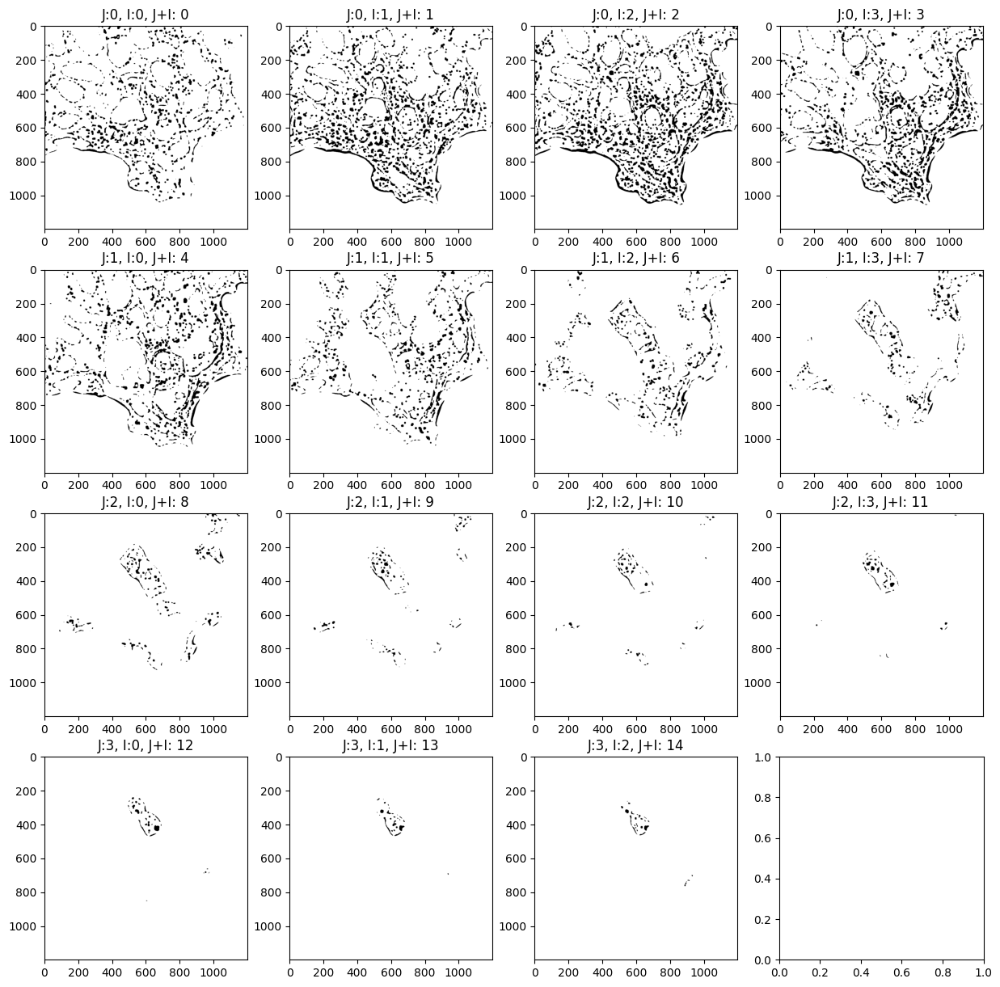

In [25]:
f, a = plt.subplots(4,4, figsize=(15,15))
kernel_size = (91, 91)  # Adjust the kernel size according to your needs
j = -1
for i, timg in enumerate(img_stack[1:]):
    if not i%4 and j<3:
        j+=1        
    kernel_size = (9,)*2
    shape = cv2.MORPH_RECT
    kernel = cv2.getStructuringElement(shape, kernel_size)
    temp = cv2.erode(timg, kernel)

    temp = cv2.GaussianBlur(temp, (9,9) , 1)
    temp = cv2.adaptiveThreshold(temp, timg.max(), cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 75,1)
    # # _, temp = cv2.threshold(img, img.min(),img.max(), cv2.THRESH_OTSU+cv2.THRESH_BINARY)
    # temp = cv2.morphologyEx(temp, cv2.MORPH_OPEN, (75,75))
    temp = cv2.medianBlur(temp, 5)
    if j == 0 and i == 3:
        image = temp
    # temp[temp >=12] = temp.max()
    a[j, i%4].imshow(temp,cmap='gray')
    a[j, i%4].set_title(f"J:{j}, I:{i%4}, J+I: {i}")
# temp = cv2.morphologyEx(temp, cv2.MORPH_OPEN, kernel_size)


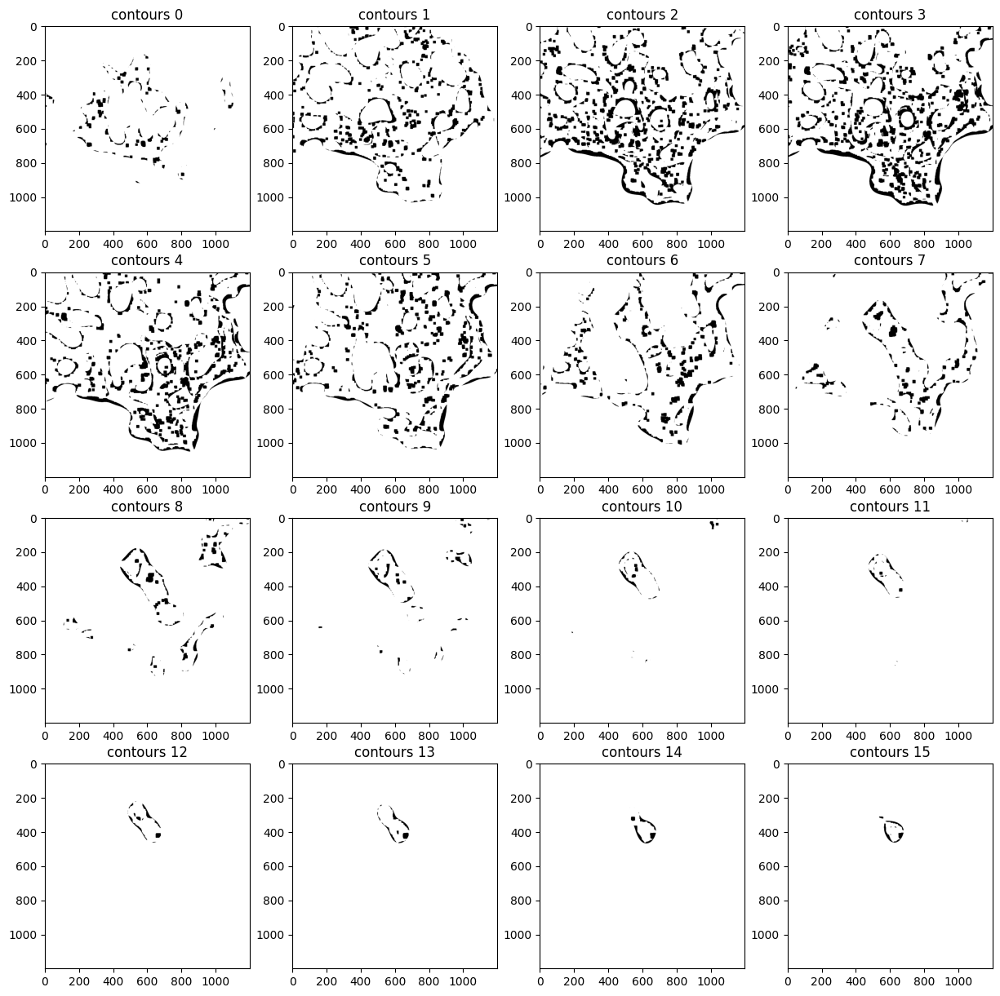

In [26]:
f, a = plt.subplots(4,4, figsize=(15,15))
kernel_size = (91, 91)  # Adjust the kernel size according to your needs
j = -1



for i, timg in enumerate(img_stack):
    if not i%4 and j<3:
        j+=1        
    temp = cv2.GaussianBlur(timg, (9,)*2 ,1)
    kernel_size = (15,)*2
    shape = cv2.MORPH_RECT
    kernel = cv2.getStructuringElement(shape, kernel_size)
    temp = cv2.erode(temp, kernel)
    # temp = cv2.erode(timg, kernel)

    # temp = cv2.GaussianBlur(temp, (9,9) , 1)
    temp = cv2.adaptiveThreshold(temp, timg.max(), cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 155,1)
    # _, temp = cv2.threshold(img, img.min(),img.max(), cv2.THRESH_OTSU+cv2.THRESH_BINARY)
    # temp = cv2.morphologyEx(temp, cv2.MORPH_OPEN, (7,7))
    # temp = cv2.morphologyEx(temp, cv2.MORPH_CLOSE, (7,7))
    # temp = cv2.medianBlur(temp, 9)
    # if j == 0 and i == 3:
    #     image = temp
    # # temp[temp >=12] = temp.max()

    # temp[temp > 0] = 1
    # a[j, i%4].imshow(img + abs(temp.astype(int)-1)*img.max(),cmap='gray')

    a[j, i%4].imshow(temp,cmap='gray')
    a[j, i%4].set_title(f"contours {i}")
# temp = cv2.morphologyEx(temp, cv2.MORPH_OPEN, kernel_size)


In [27]:
def zero_pad(img: np.ndarray, kernel: np.ndarray):
    M, N = img.shape
    m, n = kernel.shape
    x=2
    padded_img = np.zeros((x*M, x*N))
    padded_k = np.zeros((x*M, x*N))
    padded_img[::x,::x] = img
    m_f, m_c = int(np.floor(m/2)), int(np.ceil(m/2))
    n_f, n_c = int(np.floor(n/2)), int(np.ceil(n/2))
    padded_k[M-m_f:M+m_c, N-n_f:N+n_c] = kernel
    return padded_img, padded_k

def gaussian_filter(kernel_size:tuple, sigma: float, k: float, a: float = None):
    filter = np.zeros(kernel_size)
    M, N = kernel_size
    rows = int(((M-1)* 2** 0.5)/ 2)
    cols = int(((N-1)* 2** 0.5)/ 2)
    for i in range(rows):
        for j in range(cols):
            r1 = ((M//2 - i)**2 + (N//2 - j)**2)**0.5
            r2 = M//2-i
            r3 = N//2 -j
            filter[i, j] = k * np.exp (-r1**2/(2*sigma**2))
            filter[i, -j-1] =  k * np.exp (-r1**2/(2*sigma**2))
            filter[-i-1, j] = k * np.exp (-r1**2/(2*sigma**2))
            filter[-i-1, -j-1] = k * np.exp (-r1**2/(2*sigma**2))
            filter[i, M//2] = k * np.exp (-r2**2/(2*sigma**2))
            filter[-i-1, M//2] = k * np.exp (-r2**2/(2*sigma**2))
            filter[N//2, j] = k * np.exp (-r3**2/(2*sigma**2))
            filter[N//2, -j-1] = k * np.exp (-r3**2/(2*sigma**2))

    filter[M//2, N//2] = k
    if a: return filter + a
    return filter

def normal_img(img:np.ndarray):
    return ((img-img.min())/(img.max()-img.min()))*255  
      
def filter_freq_domain(img: np.ndarray, kernel: np.ndarray):
    img, k = zero_pad(img, kernel)
    ifft_img = np.fft.fft2(img)
    ifft_img = ifft_img * k
    ifft_img = np.fft.ifft2(ifft_img)
    ifft_img = (np.real(ifft_img)**2 + np.imag(ifft_img) ** 2) ** 0.5
    ifft_img = normal_img(ifft_img)
    return ifft_img

 


In [28]:
def freq_plot(method: str):
    img_list = []
    f, a = plt.subplots(4,4, figsize=(20,)*2)
    j = -1
    ksize= (300,300)
    Lker = gaussian_filter(ksize, 25, 0.85)
    if method == "Him":
        mask = 1 - Lker
    elif method == "Lker":
        mask = Lker
    elif method == "HAim":
        mask = (1 + 0.85) - Lker
    else:
        raise BaseException("method is not in: [Him, Lker, HAim]")
    for i, timg in enumerate(img_stack):       
        filterd_img = filter_freq_domain(timg, mask)
        img_list.append(filterd_img)
        if not i%4 and j<3:
            j+=1        
        a[j, i%4].imshow(filterd_img,cmap='gray')
        a[j, i%4].set_title(f"{method}, {i}")
    return img_list


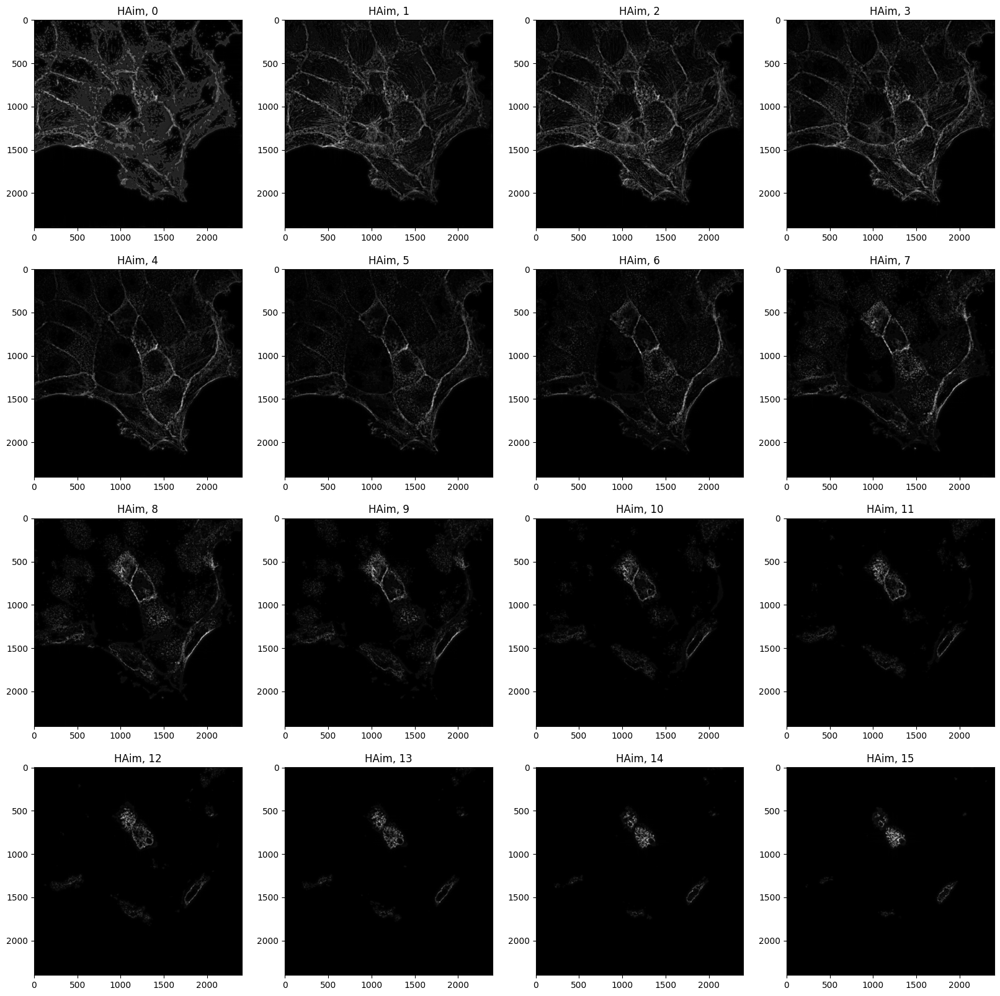

In [29]:
filterd_list = freq_plot("HAim")

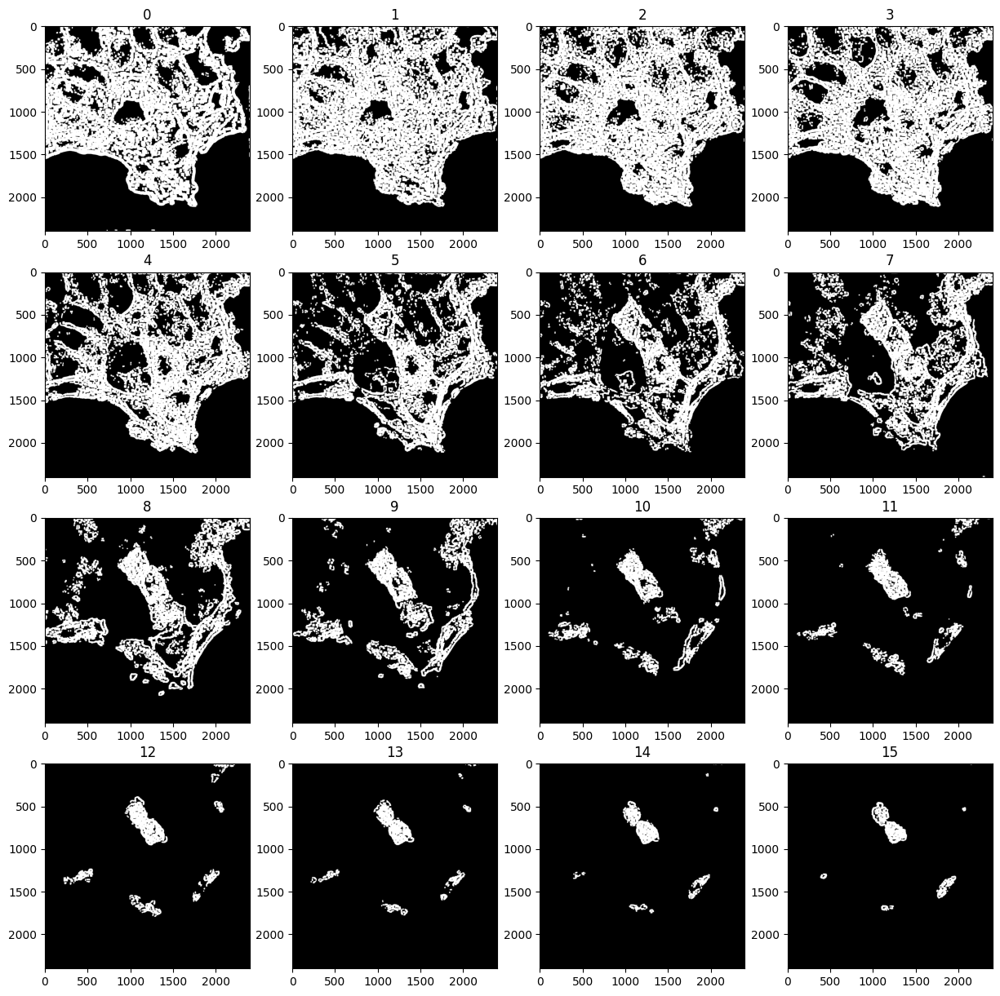

In [30]:
from scipy.ndimage import maximum_filter, minimum_filter

f, a = plt.subplots(4,4, figsize=(15,15))
j = -1

for i, timg in enumerate(filterd_list):
    if not i%4 and j<3:
        j+=1     
    # kernel_size = (15,)*2
    temp = timg.copy().astype(np.uint8)
    temp = cv2.GaussianBlur(temp, (13,)*2 ,1)
    shape = cv2.MORPH_RECT
    kernel_size = (15,)*2

    kernel = cv2.getStructuringElement(shape, kernel_size)
    temp = cv2.erode(temp, kernel)

    # # temp = cv2.GaussianBlur(temp, (9,9) , 1)
    temp = cv2.adaptiveThreshold(temp, timg.max(), cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 75,2)
    # temp = cv2.dilate(temp, kernel)
    # _, temp = cv2.threshold(timg, timg.min(),timg.max(), cv2.THRESH_OTSU+cv2.THRESH_BINARY)
    # temp = cv2.morphologyEx(temp, cv2.MORPH_OPEN, (7,7))
    temp = cv2.morphologyEx(temp, cv2.MORPH_CLOSE, (7,)*2)
    # temp = cv2.medianBlur(temp, 9)
    # if j == 0 and i == 3:
    #     image = temp
    # temp[temp >=120] = temp.max()
    
    # temp[temp < 120] = 0
    # a[j, i%4].imshow(img + abs(temp.astype(int)-1)*img.max(),cmap='gray')
    temp += 1
    temp = maximum_filter(temp, 10)
    temp = maximum_filter(temp, 3)
    # temp = minimum_filter(temp, 3)
    # temp = binary_dilation(temp)
    a[j, i%4].imshow(temp+1,cmap='gray')
    a[j, i%4].set_title(f"{i}")
    # a[j, i%4].set_title(f"{np.unique(temp)}")
# temp = cv2.morphologyEx(temp, cv2.MORPH_OPEN, kernel_size)


In [31]:
from scipy.ndimage import convolve

def adaptive_mean_filter(image, kernel_size, threshold):
    # Create a square kernel of size kernel_size
    kernel = np.ones((kernel_size, kernel_size))

    # Compute the local mean using convolution
    local_mean = convolve(image, kernel) / (kernel_size**2)

    # Find the absolute difference between the pixel and local mean
    diff = np.abs(image - local_mean)

    # Create a mask based on the threshold
    mask = (diff > threshold)

    # Apply the adaptive mean filter
    filtered_image = np.where(mask, local_mean, image)

    return filtered_image

[  0 255]


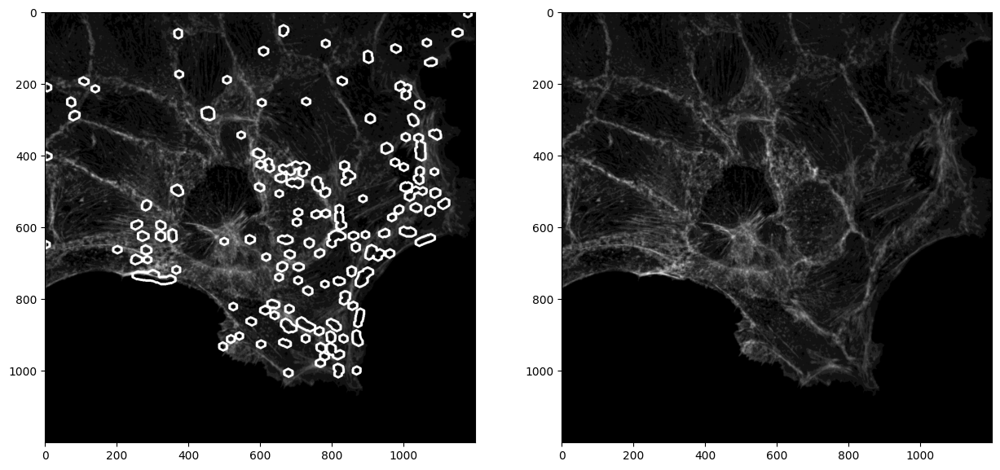

In [32]:
def identify_cell_borders(image):
    # Convert the image to grayscale
    # gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = image
    # Apply adaptive thresholding to obtain a binary image
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    # Perform morphological operations to enhance cell borders
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    eroded = cv2.erode(binary, kernel, iterations=3)
    dilated = cv2.dilate(eroded, kernel, iterations=5)

    # Find contours of the dilated image
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create a mask for the cell borders
    cell_border_mask = np.zeros_like(image)
    cv2.drawContours(cell_border_mask, contours, -1, (255, 255, 255), thickness=6)  # Increase thickness to 6 pixels

    return cell_border_mask

cells = identify_cell_borders(image)
test = img_stack[1].copy()
test[cells == 255] = test.max()
print(np.unique(cells))
fig = plt.figure(figsize=(15,15))
fig.add_subplot(1,2,1).imshow(test,cmap='gray')
fig.add_subplot(1,2,2).imshow(img_stack[1], cmap='gray')

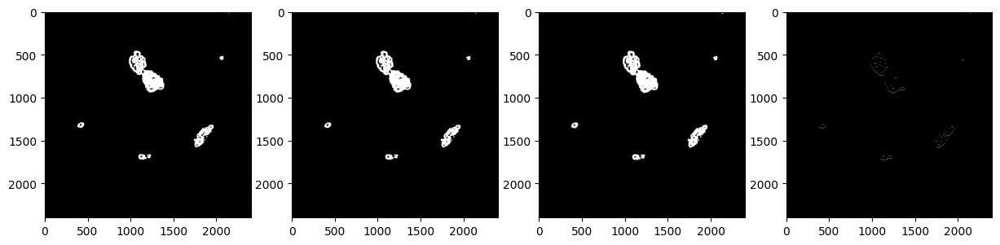

In [33]:
f, a = plt.subplots(1,4, figsize=(15,15))
kernel_size = (50,50)
temp_img = cv2.blur(temp, (9,9))
a[0].imshow(temp_img, cmap='gray')
temp_img = cv2.morphologyEx(temp_img, cv2.MORPH_OPEN, kernel_size)
a[1].imshow(temp_img, cmap='gray')
# temp_img = cv2.morphologyEx(temp_img, cv2.MORPH_CLOSE, kernel_size)
t = temp_img.copy()
temp_img = cv2.dilate(temp_img,kernel_size,iterations = 3)
a[2].imshow(temp_img, cmap='gray')
a[3].imshow(temp_img-t, cmap='gray')

# plt.imshow(temp_img,cmap='gray')

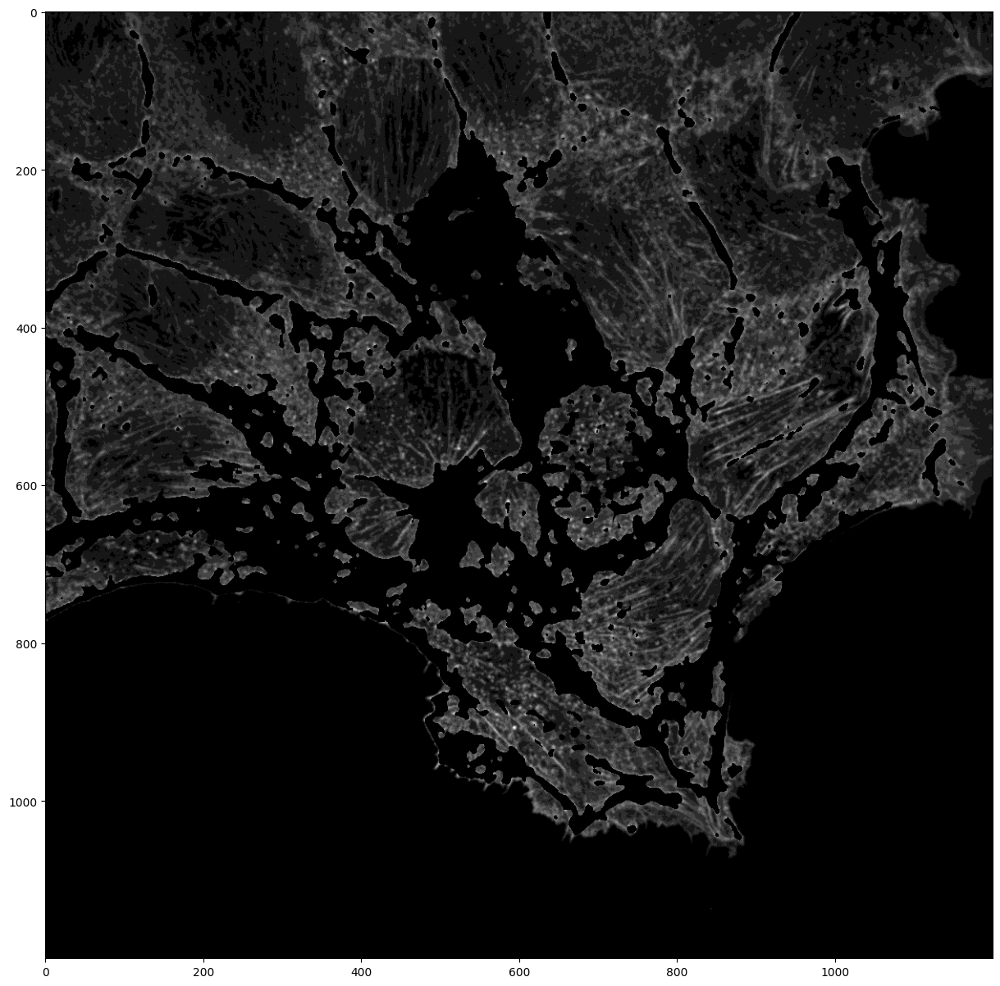

In [ ]:
kernel_size = (9, 9) 
# filtered_img = cv2.GaussianBlur(test, kernel_size, 0)

plt.figure(figsize=(15,15))
plt.imshow(test, cmap='gray')
